# Notebook for testing Caption Generator Program Code

### Masking unnecessary warnings for easy readability

In [1]:
import logging
import os

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # FATAL
logging.getLogger('tensorflow').setLevel(logging.FATAL)

### Clearing the Tensorflow GPU Memory before training models.  Also enable memory growth on all GPUs

In [2]:
import tensorflow as tf

# Enable memory growth for all GPUs
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)

E0000 00:00:1733804042.081198   46571 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1733804042.093976   46571 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


### Set Paths for the Input Folders & Files to Handle

In [3]:
current_dir = os.getcwd()
# Path to dataset
dataset_path = os.path.join(current_dir, 'dataset')
# Image file path
image_file_path = os.path.join(current_dir, 'dataset', 'images')
# Path to models
model_path = os.path.join(current_dir, 'models')
# Path to generated data
generated_data_path = os.path.join(current_dir, 'generated_data')

# Path to caption text file
caption_text_file = dataset_path + '/' + 'captions.txt'
# Path to image files
image_files = dataset_path + '/' + 'images'

# Step 1: Download dataset from Kaggle

In [4]:
import os
from import_dataset import ImportData

current_dir = os.getcwd()
destination_path = os.path.join(current_dir, 'dataset')

DataImport = ImportData()

DataImport.download(destination_path)

Path to dataset files: /home/npate145/.cache/kagglehub/datasets/nunenuh/flickr8k/versions/2
Files and folders copied successfully.


# Step 2: Data Exploration

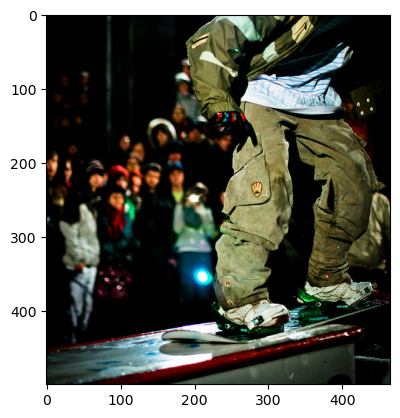

Shape of the Image  = (500, 465, 3)
3050264832_4215f2b398.jpg|0|A boy is standing on a snowboard in front of a crowd .

3050264832_4215f2b398.jpg|1|A crowd stands in the background watching someone sliding down a ramp on a board .

3050264832_4215f2b398.jpg|2|A crowd watching a snowboarder .

3050264832_4215f2b398.jpg|3|A man sliding on a concrete bench on his snowboard as people watch

3050264832_4215f2b398.jpg|4|Snowboarder is standing on his board while the crowd watches him .



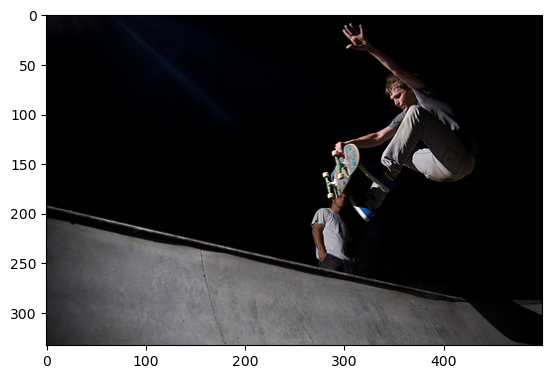

Shape of the Image  = (333, 500, 3)
3064097919_e536ab9693.jpg|0|A skateboarder is doing a trick at the top of a ramp while another person watches .

3064097919_e536ab9693.jpg|1|A skateboarder is doing a trick off of a ramp while a guy looks on .

3064097919_e536ab9693.jpg|2|A skateboarder is in midair in the middle of a trick .

3064097919_e536ab9693.jpg|3|A teenage boy does a skateboard trick on a half pipe while another boy watches from the top .

3064097919_e536ab9693.jpg|4|Young man doing a trick jump on a skateboard .



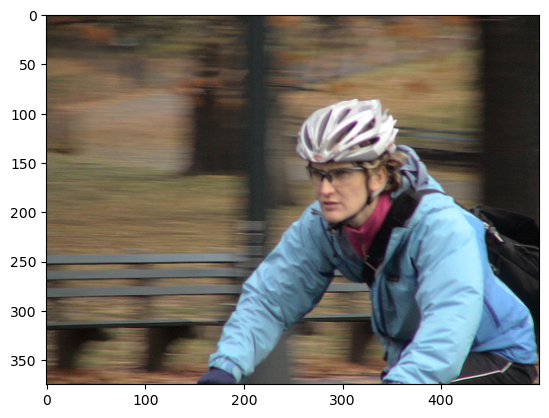

Shape of the Image  = (375, 500, 3)
2084217208_7bd9bc85e5.jpg|0|A person in a blue jacket , wearing a bicycle helmet is riding a bike

2084217208_7bd9bc85e5.jpg|1|A woman is riding her bicycle .

2084217208_7bd9bc85e5.jpg|2|A woman riding a bike in a park

2084217208_7bd9bc85e5.jpg|3|A woman with a blue jacket wears a helmet as she rides a bike .

2084217208_7bd9bc85e5.jpg|4|A woman with a helmet riding a bike .



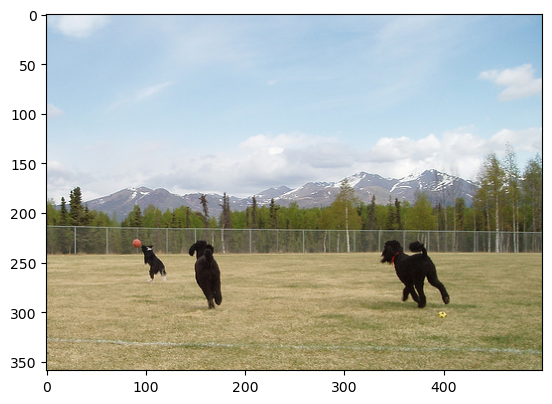

Shape of the Image  = (359, 500, 3)
3562470436_6e193643ce.jpg|0|Three black dogs playing in a fenced area with a ball .

3562470436_6e193643ce.jpg|1|Three black dogs running after an orange ball .

3562470436_6e193643ce.jpg|2|Three dogs are playing with a red ball in a field .

3562470436_6e193643ce.jpg|3|Three dogs play with a red ball .

3562470436_6e193643ce.jpg|4|Three dogs run after a ball in a field .



In [5]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import random
import numpy as np

# Check shape of the images by using a random image 
files = [f for f in os.listdir(image_file_path) if os.path.isfile(os.path.join(image_file_path, f))]
image_files = files[:4]

# Check the contents of the caption text file
with open(caption_text_file, 'r') as file:
    lines = file.readlines()

for img in image_files:
    image = Image.open(os.path.join(image_file_path, img))
    image = np.array(image)

    plt.imshow(image)
    plt.show()

    print(f'Shape of the Image  = {image.shape}')

    for line in lines:
        if line.__contains__(img):
            print(line)

# Step 3: Image Feature Extraction

In [6]:
# Define what keras feature extraction model to use
feature_extraction_algo_name = 'Xception'

In [7]:
# %%script True

from feature_extractor import ExtractFeatures
import pickle
import time

# Instantiate the ExtractFeatures() class
FeatExtractor_Obj = ExtractFeatures(feature_extraction_algo_name)

# Load keras feature extraction model
FeatExtractor_Obj.init_model()

# Kick off timer
start_time = time.perf_counter()
# Extract Features from the Image data
image_features = FeatExtractor_Obj.extract_features(image_file_path)
# End timer
end_time = time.perf_counter()

feature_extraction_elapsed_time = float(end_time - start_time) * 10**6

# Save image features to a pickle file
pickle_file_name = os.path.join(generated_data_path, ('features_' + feature_extraction_algo_name + '.pkl'))
os.makedirs(os.path.dirname(pickle_file_name), exist_ok=True)
FeatExtractor_Obj.save_features(image_features, pickle_file_name)

print(f'Total Feature Extraction Time = {feature_extraction_elapsed_time:.03f} micro secs for {image_features}')

0it [00:00, ?it/s]

I0000 00:00:1733804050.569852   46571 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 4160 MB memory:  -> device: 0, name: NVIDIA RTX A3000 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6


  0%|          | 0/8091 [00:00<?, ?it/s]

I0000 00:00:1733804052.382238   46836 service.cc:148] XLA service 0x7fbf38002bf0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733804052.382381   46836 service.cc:156]   StreamExecutor device (0): NVIDIA RTX A3000 Laptop GPU, Compute Capability 8.6
I0000 00:00:1733804052.633336   46836 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1733804054.882805   46836 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Total Feature Extraction Time = 491180236.792 micro secs for {'3050264832_4215f2b398': array([[0.02027946, 0.00463417, 0.20685127, ..., 0.00652693, 0.04018338,
        0.        ]], dtype=float32), '3064097919_e536ab9693': array([[0.        , 0.32428157, 0.05803447, ..., 0.15684392, 0.19957043,
        0.        ]], dtype=float32), '2084217208_7bd9bc85e5': array([[0.1315994 , 0.26670864, 0.00353184, ..., 0.        , 0.08326236,
        0.8601729 ]], dtype=float32), '3562470436_6e193643ce': array([[0.6528777 , 0.24432552, 0.        , ..., 0.        , 0.03865516,
        0.22773637]], dtype=float32), '3604314527_5077cd9d43': array([[0.7771419 , 0.8228921 , 0.        , ..., 0.01301958, 0.        ,
        0.        ]], dtype=float32), '3545793128_af3af544dc': array([[0.00000000e+00, 1.23615615e-01, 1.49151087e-01, ...,
        2.28044088e-03, 8.52893791e-05, 3.59116912e-01]], dtype=float32), '2095007523_591f255708': array([[0.1763612 , 0.        , 0.00021056, ..., 0.        , 0.        ,


In [8]:
from feature_extractor import ExtractFeatures
import pickle
import time

# Instantiate the ExtractFeatures() class
FeatExtractor_Obj = ExtractFeatures(feature_extraction_algo_name)

loaded_features = dict()
# Load features from pickle file
pickle_file_name = os.path.join(generated_data_path, ('features_' + feature_extraction_algo_name + '.pkl'))
loaded_features = FeatExtractor_Obj.load_feature_model(pickle_file_name)

print(loaded_features)

{'3050264832_4215f2b398': array([[0.02027946, 0.00463417, 0.20685127, ..., 0.00652693, 0.04018338,
        0.        ]], dtype=float32), '3064097919_e536ab9693': array([[0.        , 0.32428157, 0.05803447, ..., 0.15684392, 0.19957043,
        0.        ]], dtype=float32), '2084217208_7bd9bc85e5': array([[0.1315994 , 0.26670864, 0.00353184, ..., 0.        , 0.08326236,
        0.8601729 ]], dtype=float32), '3562470436_6e193643ce': array([[0.6528777 , 0.24432552, 0.        , ..., 0.        , 0.03865516,
        0.22773637]], dtype=float32), '3604314527_5077cd9d43': array([[0.7771419 , 0.8228921 , 0.        , ..., 0.01301958, 0.        ,
        0.        ]], dtype=float32), '3545793128_af3af544dc': array([[0.00000000e+00, 1.23615615e-01, 1.49151087e-01, ...,
        2.28044088e-03, 8.52893791e-05, 3.59116912e-01]], dtype=float32), '2095007523_591f255708': array([[0.1763612 , 0.        , 0.00021056, ..., 0.        , 0.        ,
        0.        ]], dtype=float32), '3596459539_a47aa80612'

In [9]:
%%script False
# Resetting GPU for the next job
from numba import cuda 
device = cuda.get_current_device()
device.reset()

Couldn't find program: 'False'


# Step 4: Loading and Preprocessing Caption Data

### Create image to caption mapping table

In [10]:
from caption_data_processing import CaptionDataProcessing

# Instantiate the LoadCaptionData() class
CaptionData_Obj = CaptionDataProcessing()

image_to_captions_mapping_table = CaptionData_Obj.image_to_caption_mapping(caption_text_file)

# Print the total number of captions
total_captions = sum(len(captions) for captions in image_to_captions_mapping_table.values())
print("Total number of captions:", total_captions)
for key, value in image_to_captions_mapping_table.items():
    print(image_to_captions_mapping_table[key])

0it [00:00, ?it/s]

  0%|          | 0/40456 [00:00<?, ?it/s]

Total number of captions: 40455
['A child in a pink dress is climbing up a set of stairs in an entry way .', 'A girl going into a wooden building .', 'A little girl climbing into a wooden playhouse .', 'A little girl climbing the stairs to her playhouse .', 'A little girl in a pink dress going into a wooden cabin .']
['A black dog and a spotted dog are fighting', 'A black dog and a tri-colored dog playing with each other on the road .', 'A black dog and a white dog with brown spots are staring at each other in the street .', 'Two dogs of different breeds looking at each other on the road .', 'Two dogs on pavement moving toward each other .']
['A little girl covered in paint sits in front of a painted rainbow with her hands in a bowl .', 'A little girl is sitting in front of a large painted rainbow .', 'A small girl in the grass plays with fingerpaints in front of a white canvas with a rainbow on it .', 'There is a girl with pigtails sitting in front of a rainbow painting .', 'Young gir

### Clean the image to caption mapping table

In [11]:
image_to_captions_mapping_table = CaptionData_Obj.clean_data(image_to_captions_mapping_table)

for key, value in image_to_captions_mapping_table.items():
    print(image_to_captions_mapping_table[key])

['<start> child in pink dress is climbing up set of stairs in an entry way <end>', '<start> girl going into wooden building <end>', '<start> little girl climbing into wooden playhouse <end>', '<start> little girl climbing the stairs to her playhouse <end>', '<start> little girl in pink dress going into wooden cabin <end>']
['<start> black dog and spotted dog are fighting <end>', '<start> black dog and tricolored dog playing with each other on the road <end>', '<start> black dog and white dog with brown spots are staring at each other in the street <end>', '<start> two dogs of different breeds looking at each other on the road <end>', '<start> two dogs on pavement moving toward each other <end>']
['<start> little girl covered in paint sits in front of painted rainbow with her hands in bowl <end>', '<start> little girl is sitting in front of large painted rainbow <end>', '<start> small girl in the grass plays with fingerpaints in front of white canvas with rainbow on it <end>', '<start> 

### Create tokenizer and save the tockens to a pickle file

In [12]:
# Creating a List of All Captions
all_captions = [caption for captions in image_to_captions_mapping_table.values() for caption in captions]
for caption in all_captions[0:20]:
    print(caption)

# Create tokenizer
tokenizer = CaptionData_Obj.tokenize_caption(all_captions)
print(tokenizer)

# Save mapping table to a pickle file
pickle_file_name = os.path.join(generated_data_path, ('tokenizer.pkl'))
os.makedirs(os.path.dirname(pickle_file_name), exist_ok=True)
CaptionData_Obj.save_tokenizer(tokenizer, pickle_file_name)

<start> child in pink dress is climbing up set of stairs in an entry way <end>
<start> girl going into wooden building <end>
<start> little girl climbing into wooden playhouse <end>
<start> little girl climbing the stairs to her playhouse <end>
<start> little girl in pink dress going into wooden cabin <end>
<start> black dog and spotted dog are fighting <end>
<start> black dog and tricolored dog playing with each other on the road <end>
<start> black dog and white dog with brown spots are staring at each other in the street <end>
<start> two dogs of different breeds looking at each other on the road <end>
<start> two dogs on pavement moving toward each other <end>
<start> little girl covered in paint sits in front of painted rainbow with her hands in bowl <end>
<start> little girl is sitting in front of large painted rainbow <end>
<start> small girl in the grass plays with fingerpaints in front of white canvas with rainbow on it <end>
<start> there is girl with pigtails sitting in fron

### Load the tokenizers from pickle file

In [13]:
tokenizer = CaptionData_Obj.load_tokenizer(pickle_file_name)
print(tokenizer)

### Calcualte max caption length and total vocabulary size

In [14]:
max_caption_length = CaptionData_Obj.max_caption_length(tokenizer, all_captions)

vocab_size = CaptionData_Obj.vocabulary_size(tokenizer)

print(f'Max Caption Length is {max_caption_length} and Total Vocabulary Size is {vocab_size}')

Max Caption Length is 34 and Total Vocabulary Size is 8766


# Step 5: Data Preparation for Model Training

In [15]:
# Define the hyperparameters
BATCH_SIZE = 32
EPOCHS = 50
LR = 0.001

In [16]:
from data_generator import ModelDataGenerator

# Instantiate the ModelTrainDataPrep() Class
ModelTrainDataPrep_Obj = ModelDataGenerator()

# Split the train and test data into 7:2:1 ratio
train_data, test_data = ModelTrainDataPrep_Obj.create_model_dataset(image_to_captions_mapping_table)

# Test the data_generator() function with train_data
input_output_data = ModelTrainDataPrep_Obj.data_generator(train_data, 
                                                          image_to_captions_mapping_table,
                                                          loaded_features, 
                                                          tokenizer,
                                                          max_caption_length,
                                                          vocab_size,
                                                          batch_size=BATCH_SIZE)

print(len(train_data), len(test_data))

inputs, output = next(input_output_data)
print(inputs[0].shape, inputs[1].shape, output.shape)

7281 810
(32, 2048) (32, 34) (32, 8766)


# Step 6:  Model Architecture Buildnig and Training

In [17]:
%load_ext autoreload
%autoreload 2
from caption_generator_architecture import ModelArchitectureAndTraining
import time

# Instantiate ModelArchitectureAndTraining() class with required parameters
ModelArchitectureAndTraining_Obj = ModelArchitectureAndTraining(train_data, test_data, image_to_captions_mapping_table,
                                                                loaded_features, tokenizer, max_caption_length,
                                                                vocab_size, epochs=EPOCHS, batch_size=BATCH_SIZE, learning_rate=LR)

# Initiate the architecture 
architecture_model = ModelArchitectureAndTraining_Obj.model_architecture(feature_extraction_algo_name)
architecture_model.summary()

# Kick off timer
start_time = time.perf_counter()
# Train the model
model, history = ModelArchitectureAndTraining_Obj.train_model(architecture_model)
# End timer
end_time = time.perf_counter()

model_training_elapsed_time = float(end_time - start_time) * 10**6
print(f'Total Feature Extraction Time = {model_training_elapsed_time:.03f} micro secs for Model: \n{model.summary()}')

/home/npate145/anaconda3/lib/python3.12/site-packages/keras/src/layers/layer.py:932: UserWarning: Layer 'lambda' (of type Lambda) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 2048)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 2048)      │          0 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 34)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 2048)      │      8,192 │ dropout[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 34, 256)   │  2,244,096 │ input_layer_2[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 256)       │    524,544 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 34, 256)   │          0 │ embedding[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal           │ (None, 34)        │          0 │ input_layer_2[0]… │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector       │ (None, 34, 256)   │          0 │ dense[0][0]       │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 34, 256)   │      1,024 │ dropout_1[0][0],  │
│ (BatchNormalizatio… │                   │            │ not_equal[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional       │ (None, 34, 512)   │  1,050,624 │ repeat_vector[0]… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_1     │ (None, 34, 512)   │  1,050,624 │ batch_normalizat… │
│ (Bidirectional)     │                   │            │ not_equal[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dot (Dot)           │ (None, 34, 34)    │          0 │ bidirectional[0]… │
│                     │                   │            │ bidirectional_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 34, 34)    │          0 │ dot[0][0]         │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, None, 512) │          0 │ activation[0][0], │
│                     │                   │            │ bidirectional_1[… │
│                     │                   │            │ not_equal[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reduce_sum          │ (None, 512)       │          0 │ lambda[0][0]      │
│ (ReduceSum)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 768)       │          0 │ reduce_sum[0][0], │
│ (Concatenate)       │                   │            │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 7,328,830 (27.96 MB)

 Trainable params: 7,324,222 (27.94 MB)

 Non-trainable params: 4,608 (18.00 KB)

Running Epoch 1 of 50.............


/home/npate145/anaconda3/lib/python3.12/site-packages/keras/src/layers/layer.py:932: UserWarning: Layer 'ein_sum' (of type EinSum) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(


227/227 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - accuracy: 0.0932 - loss: 6.8273 - val_accuracy: 0.1075 - val_loss: 6.8582
Running Epoch 2 of 50.............
227/227 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - accuracy: 0.1337 - loss: 5.0193 - val_accuracy: 0.1275 - val_loss: 6.0396
Running Epoch 3 of 50.............
227/227 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - accuracy: 0.1510 - loss: 4.6863 - val_accuracy: 0.1338 - val_loss: 6.4880
Running Epoch 4 of 50.............
227/227 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - accuracy: 0.1630 - loss: 4.4144 - val_accuracy: 0.1287 - val_loss: 6.6216
Running Epoch 5 of 50.............
227/227 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - accuracy: 0.1923 - loss: 4.0883 - val_accuracy: 0.1287 - val_loss: 7.0354
Running Epoch 6 of 50.............
227/227 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - accuracy: 0.2230 - loss: 3.7880 - val_accuracy: 0.1437 - val_loss: 7.3096
Running Epoch 7 of 50.............
227/227 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - accuracy: 0.2603 - loss: 3.4302 - val

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 2048)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 2048)      │          0 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 34)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 2048)      │      8,192 │ dropout[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 34, 256)   │  2,244,096 │ input_layer_2[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 256)       │    524,544 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 34, 256)   │          0 │ embedding[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal           │ (None, 34)        │          0 │ input_layer_2[0]… │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector       │ (None, 34, 256)   │          0 │ dense[0][0]       │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 34, 256)   │      1,024 │ dropout_1[0][0],  │
│ (BatchNormalizatio… │                   │            │ not_equal[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional       │ (None, 34, 512)   │  1,050,624 │ repeat_vector[0]… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_1     │ (None, 34, 512)   │  1,050,624 │ batch_normalizat… │
│ (Bidirectional)     │                   │            │ not_equal[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dot (Dot)           │ (None, 34, 34)    │          0 │ bidirectional[0]… │
│                     │                   │            │ bidirectional_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 34, 34)    │          0 │ dot[0][0]         │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, None, 512) │          0 │ activation[0][0], │
│                     │                   │            │ bidirectional_1[… │
│                     │                   │            │ not_equal[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reduce_sum          │ (None, 512)       │          0 │ lambda[0][0]      │
│ (ReduceSum)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 768)       │          0 │ reduce_sum[0][0], │
│ (Concatenate)       │                   │            │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 21,977,276 (83.84 MB)

 Trainable params: 7,324,222 (27.94 MB)

 Non-trainable params: 4,608 (18.00 KB)

 Optimizer params: 14,648,446 (55.88 MB)

Total Feature Extraction Time = 348910562.644 micro secs for Model: 
None


In [18]:
%reload_ext autoreload
%autoreload 2

# Save the model to .keras file
filename = 'model.image_cation_generator_cnn_' + feature_extraction_algo_name + '_LR_' + str(LR) + '_BATCH_SIZE_' + str(BATCH_SIZE) + '_EPOCH_' + str(EPOCHS) + '.keras'
# filename = 'model.image_cation_generator_cnn_' + feature_extraction_algo_name + '.keras'
model_file = os.path.join(model_path, filename)
ModelArchitectureAndTraining_Obj.save_model(model, model_file)

In [19]:
%reload_ext autoreload
%autoreload 2

# Load the model to use for prediction
filename = 'model.image_cation_generator_cnn_' + feature_extraction_algo_name + '_LR_' + str(LR) + '_BATCH_SIZE_' + str(BATCH_SIZE) + '_EPOCH_' + str(EPOCHS) + '.keras'
# filename = 'model.image_cation_generator_cnn_' + feature_extraction_algo_name + '.keras'
model_file = os.path.join(model_path, filename)
image_caption_model = ModelArchitectureAndTraining_Obj.load_model(model_file)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 2048)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 2048)      │          0 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 34)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 2048)      │      8,192 │ dropout[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 34, 256)   │  2,244,096 │ input_layer_2[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 256)       │    524,544 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 34, 256)   │          0 │ embedding[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal           │ (None, 34)        │          0 │ input_layer_2[0]… │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector       │ (None, 34, 256)   │          0 │ dense[0][0]       │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 34, 256)   │      1,024 │ dropout_1[0][0],  │
│ (BatchNormalizatio… │                   │            │ not_equal[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional       │ (None, 34, 512)   │  1,050,624 │ repeat_vector[0]… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_1     │ (None, 34, 512)   │  1,050,624 │ batch_normalizat… │
│ (Bidirectional)     │                   │            │ not_equal[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dot (Dot)           │ (None, 34, 34)    │          0 │ bidirectional[0]… │
│                     │                   │            │ bidirectional_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 34, 34)    │          0 │ dot[0][0]         │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, None, 512) │          0 │ activation[0][0], │
│                     │                   │            │ bidirectional_1[… │
│                     │                   │            │ not_equal[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reduce_sum          │ (None, 512)       │          0 │ lambda[0][0]      │
│ (ReduceSum)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 768)       │          0 │ reduce_sum[0][0], │
│ (Concatenate)       │                   │            │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 7,328,830 (27.96 MB)

 Trainable params: 7,324,222 (27.94 MB)

 Non-trainable params: 4,608 (18.00 KB)

None


# Step 7: Run Performance Metric Analysis

### Calculate the BLEU score of the model

In [20]:
%reload_ext autoreload
%autoreload 2

from tqdm.notebook import tqdm
tqdm().pandas()
from model_predicton import ModelPrediction
from nltk.translate.bleu_score import corpus_bleu
import tensorflow as tf
from caption_generator_architecture import ModelArchitectureAndTraining
from tensorflow.keras.layers import Lambda

# Instantiate the ModelPrediction() class
ModelPrediction_Obj = ModelPrediction(image_caption_model)

# Initialize lists to store actual and predicted captions
actual_captions_list = []
predicted_captions_list = []

# Loop through the test data
for key in tqdm(test_data):
    # Get actual captions for the current image
    actual_captions = image_to_captions_mapping_table[key]
    # Predict the caption for the image using the model
    predicted_caption = ModelPrediction_Obj.predict_caption(loaded_features[key], tokenizer, max_caption_length)
    
    # Split actual captions into words
    actual_captions_words = [caption.split() for caption in actual_captions]
    # Split predicted caption into words
    predicted_caption_words = predicted_caption.split()
    
    # Append to the lists
    actual_captions_list.append(actual_captions_words)
    predicted_captions_list.append(predicted_caption_words)

# Calculate BLEU score
bleu_1_score = corpus_bleu(actual_captions_list, predicted_captions_list, weights=(1.0, 0, 0, 0))
bleu_2_score = corpus_bleu(actual_captions_list, predicted_captions_list, weights=(0.5, 0.5, 0, 0.0))

print("BLEU-1: %.2f" % bleu_1_score)
print("BLEU-2: %.2f" % bleu_2_score)

0it [00:00, ?it/s]

  0%|          | 0/810 [00:00<?, ?it/s]

/home/npate145/anaconda3/lib/python3.12/site-packages/keras/src/layers/layer.py:932: UserWarning: Layer 'ein_sum' (of type EinSum) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/home/npate145/anaconda3/lib/python3.12/site-packages/keras/src/layers/layer.py:932: UserWarning: Layer 'lambda' (of type Lambda) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(


BLEU-1: 0.26
BLEU-2: 0.11


### Plot the accuracy and loss data for currently built model

In [21]:
# A utility function to merge all the accuracy and loss values from history
def merge_dictionary_list(dict_list):
    return {
        k: [d.get(k) for d in dict_list if k in d] 
        for k in set().union(*dict_list) 
  }

print(history)
history = merge_dictionary_list(history)

history_data = {'train_accuracy': [], 'train_loss': [], 'valid_accuracy': [], 'valid_loss': []}

for key, value in history.items():
    for idx in value:
        # value1 = history[index]
        if key == 'accuracy':
            key = 'train_accuracy'
        if key == 'loss':
            key = 'train_loss'
        if key == 'val_accuracy':
            key = 'valid_accuracy'
        if key == 'val_loss':
            key = 'valid_loss'    
        history_data[key].append(idx[0])

history_data

[{'accuracy': [0.10779184848070145], 'loss': [6.269030570983887], 'val_accuracy': [0.10750000178813934], 'val_loss': [6.858211517333984]}, {'accuracy': [0.13394823670387268], 'loss': [5.054648399353027], 'val_accuracy': [0.1274999976158142], 'val_loss': [6.039625644683838]}, {'accuracy': [0.15212003886699677], 'loss': [4.697817325592041], 'val_accuracy': [0.13375000655651093], 'val_loss': [6.487973690032959]}, {'accuracy': [0.16767621040344238], 'loss': [4.431262016296387], 'val_accuracy': [0.1287499964237213], 'val_loss': [6.621619701385498]}, {'accuracy': [0.19286894798278809], 'loss': [4.149964332580566], 'val_accuracy': [0.1287499964237213], 'val_loss': [7.035358428955078]}, {'accuracy': [0.22095264494419098], 'loss': [3.879080057144165], 'val_accuracy': [0.14374999701976776], 'val_loss': [7.309625148773193]}, {'accuracy': [0.2461453676223755], 'loss': [3.5672335624694824], 'val_accuracy': [0.12250000238418579], 'val_loss': [7.525385856628418]}, {'accuracy': [0.27395373582839966], 

{'train_accuracy': [0.10779184848070145,
  0.13394823670387268,
  0.15212003886699677,
  0.16767621040344238,
  0.19286894798278809,
  0.22095264494419098,
  0.2461453676223755,
  0.27395373582839966,
  0.30203744769096375,
  0.34044602513313293,
  0.37486234307289124,
  0.4107929468154907,
  0.4322687089443207,
  0.4592511057853699,
  0.48306718468666077,
  0.5066079497337341,
  0.5378579497337341,
  0.5714482665061951,
  0.5945760011672974,
  0.6255506873130798,
  0.6568006873130798,
  0.6881883144378662,
  0.7042951583862305,
  0.7286618947982788,
  0.751239001750946,
  0.7615638971328735,
  0.7846916317939758,
  0.8072687387466431,
  0.8107103705406189,
  0.8151156306266785,
  0.8246145248413086,
  0.8341134190559387,
  0.8411343693733215,
  0.8431993126869202,
  0.8488436341285706,
  0.8624724745750427,
  0.8616464734077454,
  0.8681167364120483,
  0.8723843693733215,
  0.879129946231842,
  0.8774779438972473,
  0.8769273161888123,
  0.882709264755249,
  0.8824338912963867,
  0.88

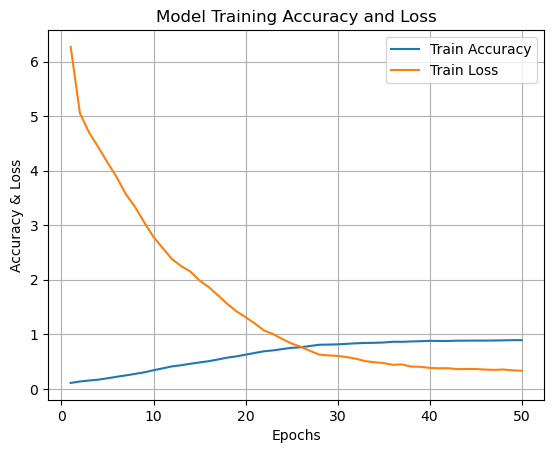

In [22]:
import matplotlib.pyplot as plt

train_accuracy = history_data['train_accuracy']
train_loss = history_data['train_loss']
# validation_accuracy = history_data['valid_accuracy']
# validation_loss = history_data['valid_loss']

# Plot the data
fig, ax = plt.subplots()
ax.plot(range(1, len(train_accuracy)+1), train_accuracy, label='Train Accuracy')
ax.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')

# Add title
ax.set_xlabel('Epochs')
ax.set_ylabel('Accuracy & Loss')
ax.set_title('Model Training Accuracy and Loss')
ax.grid(True)

# Add a legend
plt.legend()
plt.show()

### Save the complete performance metrics alongwith hyperparameters to a pickle file to be used again

In [23]:
from pickle import dump
import os

filename = 'metric_' + feature_extraction_algo_name + '_LR_' + str(LR) + '_BATCH_SIZE_' + str(BATCH_SIZE) + '_EPOCH_' + str(EPOCHS) + '.pkl'
analytic_data_file = os.path.join(generated_data_path, filename)

analytic_data = [history, 
                 bleu_1_score, 
                 bleu_2_score, 
                 feature_extraction_algo_name, 
                 LR, 
                 BATCH_SIZE, 
                 EPOCHS, 
                 model_training_elapsed_time, 
                 len(loaded_features), 
                 vocab_size, 
                 max_caption_length,
                 tokenizer,
                 feature_extraction_elapsed_time]

with open(analytic_data_file, 'wb') as file:
    dump(analytic_data, file)

### Plotting Performance Metrics

50


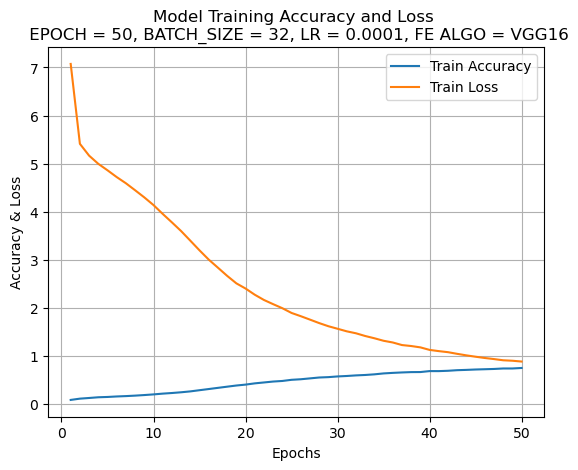

100


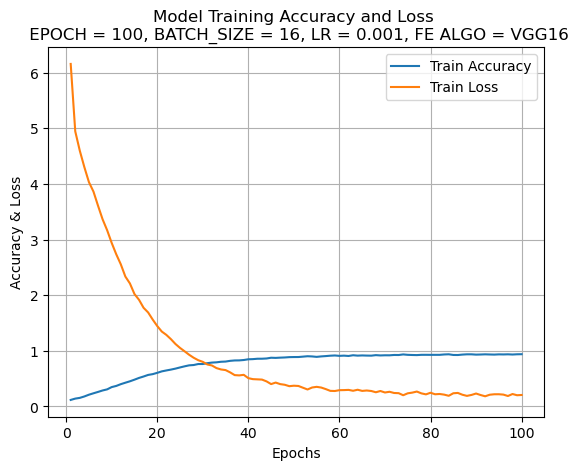

50


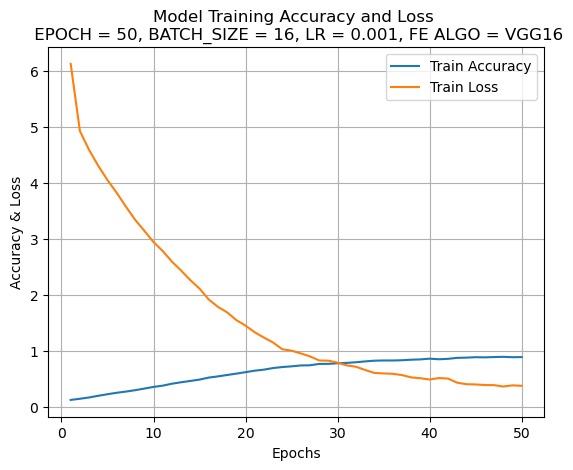

90


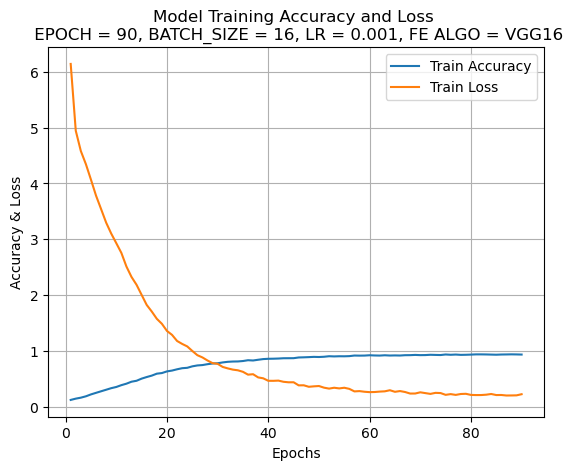

100


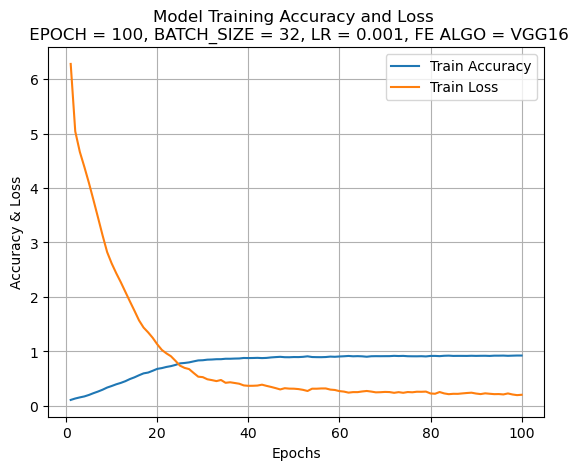

50


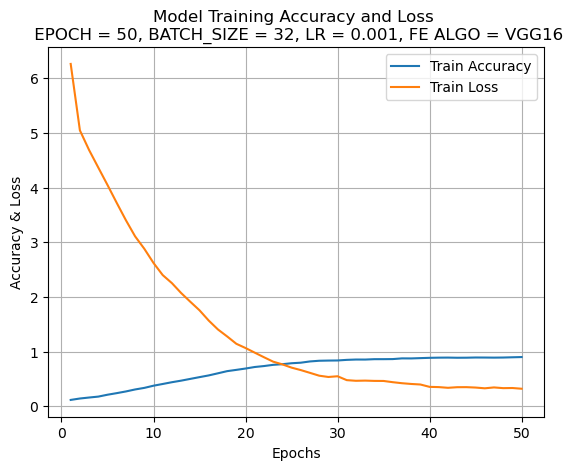

80


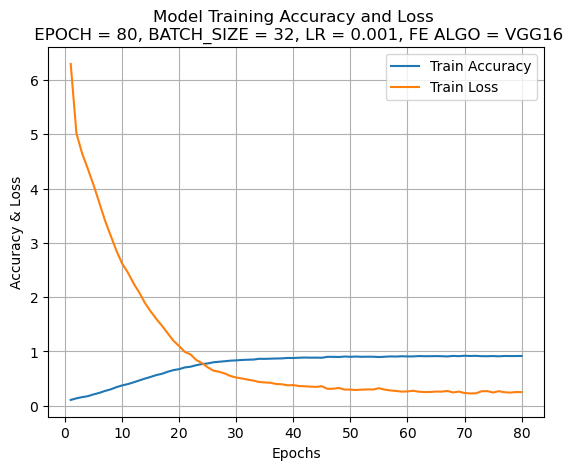

50


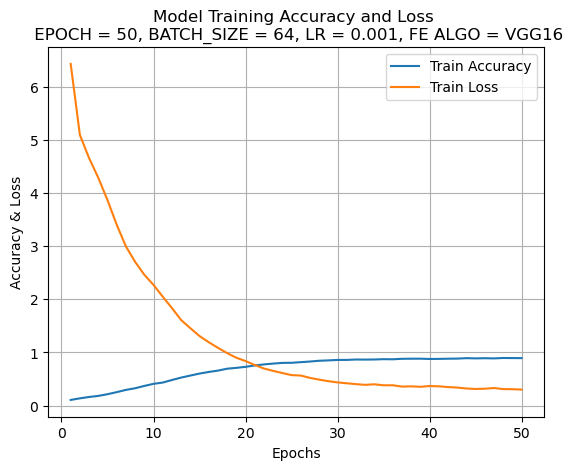

50


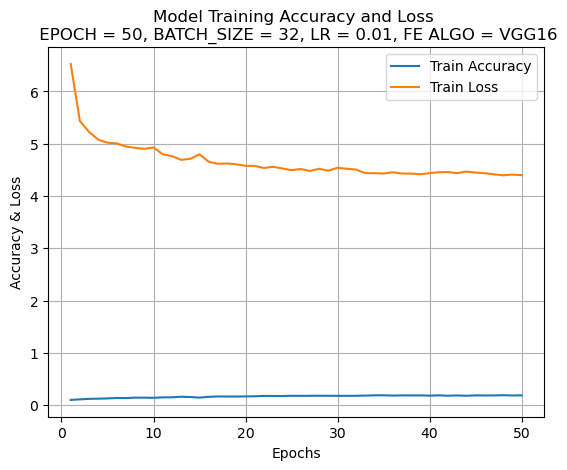

50


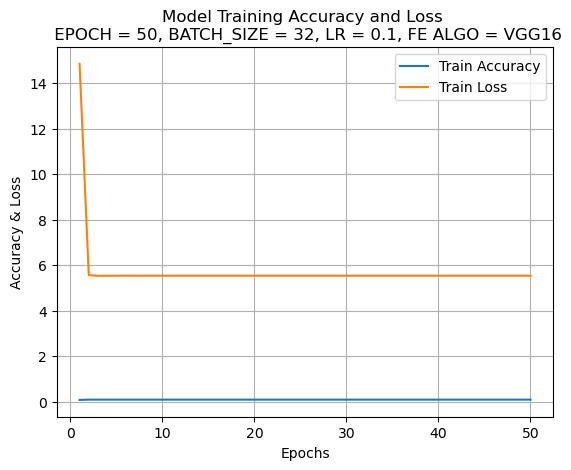

50


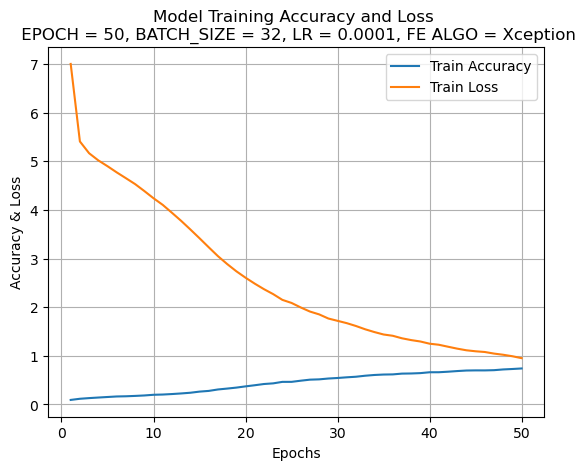

100


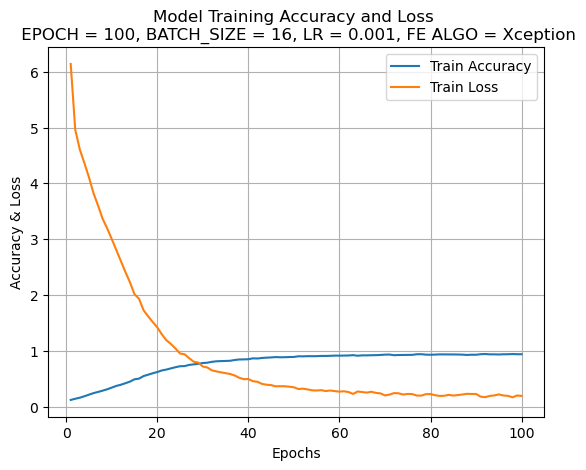

50


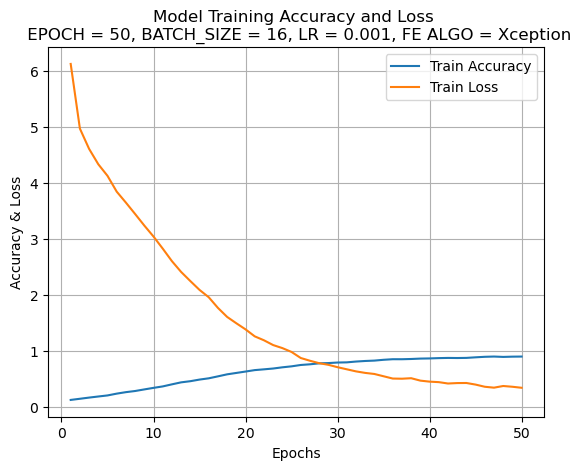

100


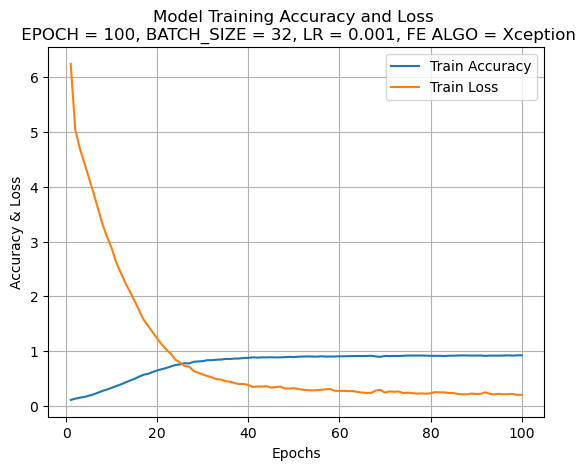

50


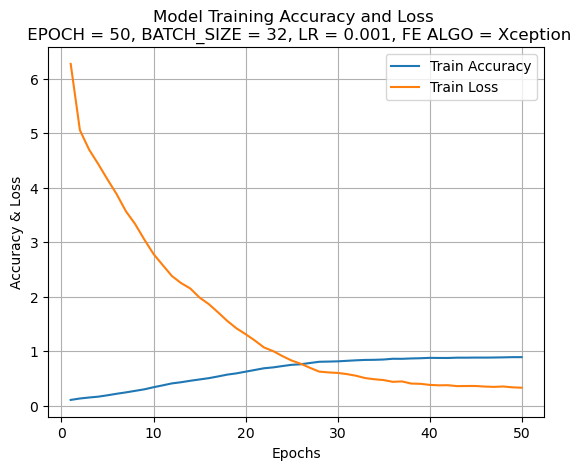

80


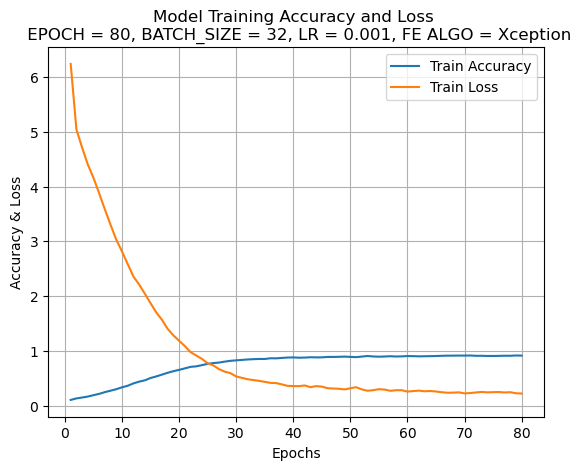

50


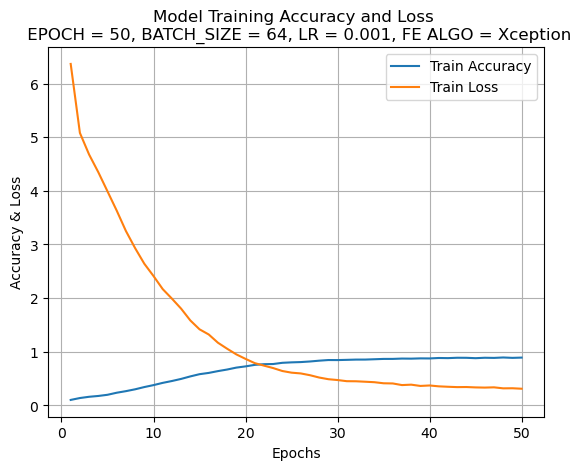

50


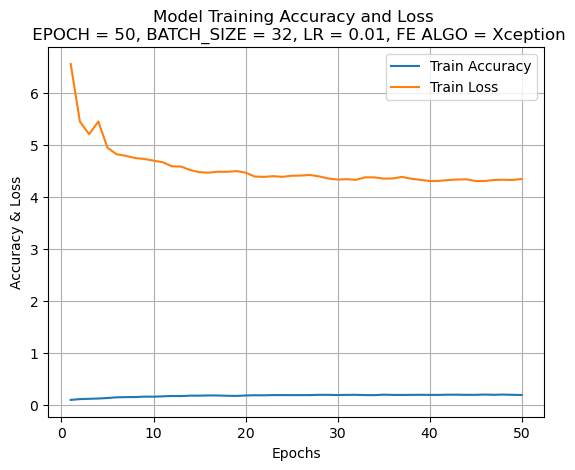

50


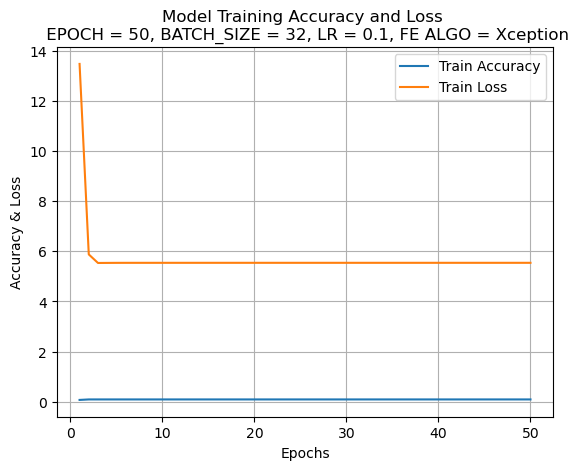

In [24]:
import os
from pickle import load
import matplotlib.pyplot as plt

def get_file_names(directory):
    file_names = []
    for filename in os.listdir(directory):
        if os.path.isfile(os.path.join(directory, filename)):
            file_names.append(filename)
    return file_names

file_list = get_file_names(generated_data_path)
file_list = sorted(file_list)

for f in file_list:
    if f.__contains__('metric_'):
        filepath = os.path.join(generated_data_path, f)
        with open(filepath, 'rb') as file:
            analytical_data = load(file)

        filename_field = str(f).split('_')
        epoch = filename_field[8].split('.')[0]
        print(epoch)
        fe_algo = filename_field[1]
        lr = filename_field[3]
        batch_size = filename_field[6]

        train_accuracy = analytical_data[0]['accuracy']
        train_loss = analytical_data[0]['loss']

        # Plot the data
        # fig, ax = plt.subplots()
        plt.plot(range(1, len(train_accuracy)+1), train_accuracy, label='Train Accuracy')
        plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
        # ax.plot(range(1, len(validation_accuracy)+1), validation_accuracy, label='Validation Accuracy')
        # ax.plot(range(1, len(validation_loss)+1), validation_loss, label='Validation Loss')

        # Add title
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy & Loss')
        model_para = f'EPOCH = {epoch}, BATCH_SIZE = {batch_size}, LR = {lr}, FE ALGO = {fe_algo}'
        plt.title(f'Model Training Accuracy and Loss \n {model_para}')
        plt.grid(True)
        
        # plt.text(0.5, -0.20, model_para, transform=plt.gca().transAxes, ha='center')

        # Add a legend
        plt.legend()
        plt.show()

### Table of Performance Metrics

In [25]:
import os
from pickle import load
import pandas as pd

# Display scientific notation for clarity
pd.options.display.float_format = '{:20,.4f}'.format

def get_file_names(directory):
    file_names = []
    for filename in os.listdir(directory):
        if os.path.isfile(os.path.join(directory, filename)):
            file_names.append(filename)
    return file_names

file_list = get_file_names(generated_data_path)
file_list = sorted(file_list)
metric_data = {'Feature Extraction Algo Name': [],
               'Feature Extraction Time (in Sec)': [],
                'Batch Size': [],
                'Epochs': [],
                'Learning Rate': [],
                'Model Training Time (in Sec)': [],
                'Training Accuracy': [],
                'Training Loss': [],
                'BLEU 1 Score': [],
                'BLEU 2 Score': []}

for f in file_list:
    if f.__contains__('metric_'):
        filepath = os.path.join(generated_data_path, f)
        with open(filepath, 'rb') as file:
            analytical_data = load(file)

        filename_field = str(f).split('_')
        epoch = filename_field[8].split('.')[0]
        # print(epoch)
 
        train_accuracy = (analytical_data[0]['accuracy'][-1])[0]
        train_loss = (analytical_data[0]['loss'][-1])[0]
        bleu_1_score = analytical_data[1]
        bleu_2_score = analytical_data[2]
        fe_algo_name = analytical_data[3]
        learning_rate = analytical_data[4]
        batch_size = analytical_data[5]
        epochs = analytical_data[6]
        model_training_time = analytical_data[7] // 10**6
        feature_extraction_time = analytical_data[12] // 10**6

        metric_data['Feature Extraction Algo Name'].append(fe_algo_name)
        metric_data['Feature Extraction Time (in Sec)'].append('{:.1f}'.format(feature_extraction_time))
        metric_data['Batch Size'].append(batch_size)
        metric_data['Epochs'].append(epochs)
        metric_data['Learning Rate'].append(learning_rate)
        metric_data['Model Training Time (in Sec)'].append('{:.1f}'.format(model_training_time))
        metric_data['Training Accuracy'].append('{:.2f}'.format(train_accuracy))
        metric_data['Training Loss'].append('{:.2f}'.format(train_loss))
        metric_data['BLEU 1 Score'].append('{:.2f}'.format(bleu_1_score))
        metric_data['BLEU 2 Score'].append('{:.2f}'.format(bleu_2_score))            
        
metric_df = pd.DataFrame(metric_data)
metric_df.to_csv('your_file_name.csv', index=False)
print(metric_df)


   Feature Extraction Algo Name Feature Extraction Time (in Sec)  Batch Size  \
0                         VGG16                            512.0          32   
1                         VGG16                            515.0          16   
2                         VGG16                            498.0          16   
3                         VGG16                            516.0          16   
4                         VGG16                            512.0          32   
5                         VGG16                            512.0          32   
6                         VGG16                            500.0          32   
7                         VGG16                            485.0          64   
8                         VGG16                            512.0          32   
9                         VGG16                            512.0          32   
10                     Xception                            498.0          32   
11                     Xception         

### Test Model With a Random Images

In [40]:
from model_predicton import ModelPrediction
from tensorflow.keras.models import load_model
import os
from PIL import Image
from pickle import load
import matplotlib.pyplot as plt
from nltk.translate.bleu_score import corpus_bleu

filename = 'model.image_cation_generator_cnn_Xception_LR_0.001_BATCH_SIZE_32_EPOCH_100.keras'
model_file = os.path.join(os.getcwd(), 'models', filename)
caption_generator_model = load_model(model_file)

ModelPrediction_Obj = ModelPrediction(caption_generator_model)

# Function for generating caption
def generate_caption(image_name):
    filename = 'metric_Xception_LR_0.001_BATCH_SIZE_32_EPOCH_100.pkl'
    with open(os.path.join(os.getcwd(), 'generated_data', filename), 'rb') as file:
        data = load(file)
        tokenizer = data[11]
        max_caption_length = data[10]

    # load the image
    image_id = image_name.split('.')[0]
    # print(image_id)
    # Image file path
    current_dir = os.getcwd()
    image_file_path = os.path.join(current_dir, 'dataset', 'images')
    img_path = os.path.join(image_file_path, image_name)
    image = Image.open(img_path)
    captions = image_to_captions_mapping_table[image_id]
    print('---------------------Actual Caption---------------------')
    for caption in captions:
        print(caption)
    # predict the caption
    predict_result = ModelPrediction_Obj.predict_caption(loaded_features[image_id], tokenizer, max_caption_length)
    print('--------------------Predicted Caption--------------------')
    print(predict_result)
    plt.imshow(image)
    plt.show()


506882688_b37d549593.jpg
---------------------Actual Caption---------------------
<start> boy standing next to large fountain with an office building in the background <end>
<start> kids are standing in the sprinklers getting soaked with water <end>
<start> people are playing in water fountains <end>
<start> people standing in water spouts in the city on sunny day <end>
<start> young person stands in spray from fountain under cloudy blue sky <end>
--------------------Predicted Caption--------------------
 little boy descends through the surf


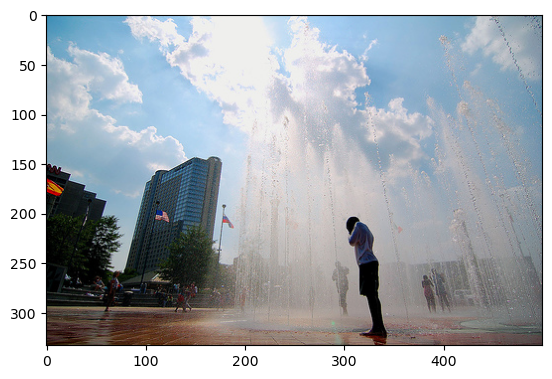

2449446913_28fa5b7c75.jpg
---------------------Actual Caption---------------------
<start> group of baseball players wearing blue uniforms walk across the grass <end>
<start> men baseball team leaving the field <end>
<start> team of baseball players in blue uniforms walking together on field <end>
<start> group of people on ball team wearing blue and white uniforms some of gloves on their hands one is wearing red shoes tall trees are in the background <end>
<start> twelve members of baseball team walk across the diamond <end>
--------------------Predicted Caption--------------------
 man in shorts is throwing laying on yellow slide on wading pool


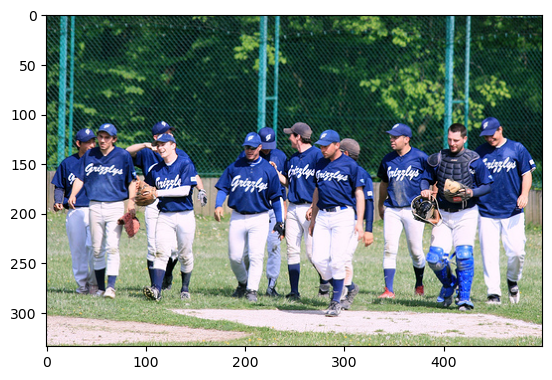

3103340819_46de7954a9.jpg
---------------------Actual Caption---------------------
<start> couple sitting on the concrete outside set of big brown wooden doors <end>
<start> two people wearing hoodies huddle on doorstep in the rain <end>
<start> two teenagers huddle in doorway in the rain <end>
<start> two young adults holding each other in front of door <end>
<start> young hooded boy and girl huddle on steps outside large doors <end>
--------------------Predicted Caption--------------------
 man with his surfboard stands in the sand


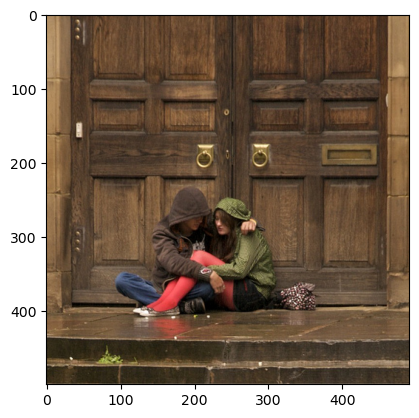

3216926094_bc975e84b9.jpg
---------------------Actual Caption---------------------
<start> brown and black dog fetching blue toy <end>
<start> dog carrying something blue and running <end>
<start> dog running with blue toy in its mouth <end>
<start> dog runs towards the camera with blue ball in his mouth <end>
<start> young german shepherd runs with toy in his mouth <end>
--------------------Predicted Caption--------------------
 energetic brown dog running through the air


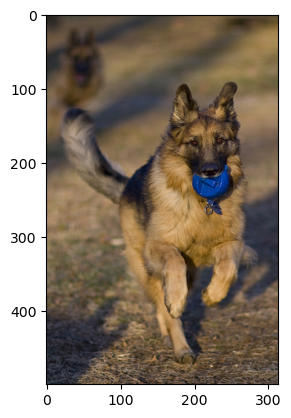

3496028495_431cfdc042.jpg
---------------------Actual Caption---------------------
<start> brown dog swimming in the water with tennis ball in his mouth <end>
<start> brown dog swims back to shore after retrieving yellow tennis ball <end>
<start> brown labradoodle retrieves tennis ball in lake <end>
<start> the brown dog is swimming <end>
<start> there is brown dog swimming outside with tennis ball in its mouth <end>
--------------------Predicted Caption--------------------
 brown dog is running down rocky


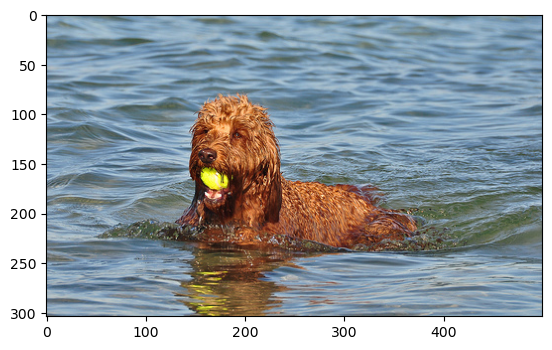

In [50]:
import random
import time

total_file_to_use = 5
all_files = []
for root, _, files in os.walk(image_file_path):
    for file in files:
        all_files.append(os.path.join(root, file))

if len(all_files) < total_file_to_use:
    raise ValueError("Not enough files in the folder.")


image_list =  random.sample(all_files, total_file_to_use)
# print(image_list)
for img in image_list:
    file = img.split('/')[-1]
    print(file)
    generate_caption(file)

    time.sleep(1)

### Test the Graphical User Interface (GUI) to select and display image alongwith the caption

In [53]:
!python caption_generator.py 'Xception'

E0000 00:00:1733834637.493375 1363433 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1733834637.496249 1363433 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
I0000 00:00:1733834639.321435 1363433 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 2991 MB memory:  -> device: 0, name: NVIDIA RTX A3000 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6
/home/npate145/anaconda3/lib/python3.12/site-packages/keras/src/layers/layer.py:932: UserWarning: Layer 'lambda' (of type Lambda) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
self.image = /home/npate145/Documents/MS_in_AI/ece5831-2024/Project/ece5831-20

#### The above code opens the GUI to select an image and displays the captions alongwith it
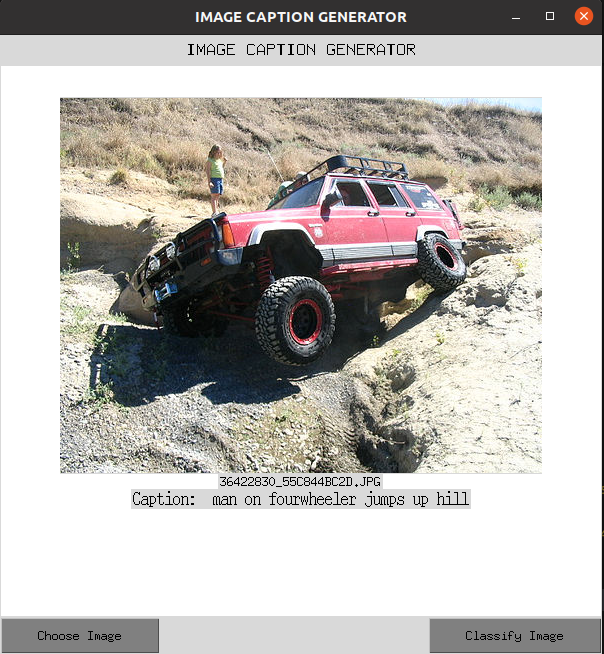